In [74]:
%load_ext autoreload
%autoreload 2

import pathlib
import pandas as pd

import utils.general as util
import utils.pandas_utils as pd_utils
import ml.visualization as viz

import warnings

warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [62]:
root = f'{pathlib.Path().absolute()}/data/march_by_inovex'
transformed_path = f'{root}/transformed'

lookup_path = f"{root}/march-dataset_lookup_march.pkl"
data_path = f"{root}/march-dataset_march1.pkl"


expLookupDF = pd.read_pickle(lookup_path)
df = pd.read_pickle(data_path)

# Transformation

In [63]:
df = df.reset_index()
df.rename(columns={'index': 'timestamp'}, inplace=True)
df.head()

,timestamp,Channel,Node,Session,Source,Status,Telegram,TelegramType,Value
0,2021-02-18 11:20:34.771901+00:00,12 | Counter A (3),12,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,8,4c082ab1c5fb459d73415cdf,Double,2.056714e+07
1,2021-02-18 11:20:34.775528+00:00,13 | Counter,13,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,136355857,6d0820a011cd24,LongStatus,NaN
2,2021-02-18 11:20:34.777714+00:00,13 | Counter B (1),13,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,8,4d0834ba7f816125d4403c40,Double,2.062952e+04
3,2021-02-18 11:20:34.781341+00:00,14 | Counter,14,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,136355857,6e0820a0111fca,LongStatus,NaN
4,2021-02-18 11:20:34.783527+00:00,14 | Counter D (2),14,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,8,4e086a77e7e0c915d440e2e2,Double,2.056715e+04


In [64]:
mergedDF = df.pivot_table(index=['timestamp'], columns=['Channel'], values=['Status', 'Value']).reset_index()
mergedDF = pd.merge(df, mergedDF, on="timestamp").reset_index()
mergedDF = mergedDF.drop(columns=['Channel', 'index', 'Value'])

channel_cols = list(mergedDF.columns)[7:len(mergedDF.columns)]
for col in channel_cols:
    mergedDF.rename(columns={col: f"{col[0]} - {col[1]}"}, inplace=True)

util.save_pkl(transformed_path, mergedDF, "merged_df.pkl")

mergedDF.head()

Successfully saved df to /Users/lukaskirner/Documents/Development/university/Thesis/edge-platforms-evaluation/backend/flow/data/march_by_inovex/transformed/merged_df.pkl


,timestamp,Node,Session,Source,Status,Telegram,TelegramType,Status - 01 | Bus Manager,Status - 01 | Operation Timer,Status - 03 | Data Manager,...,Value - 11 | Pulse Output D,Value - 12 | Counter A (3),Value - 13 | Counter B (1),Value - 14 | Counter D (2),Value - 20 | Flow Speed [m/s],Value - 21 | Volume Flow [m3/s],Value - 22 | Mass Flow [kg/s],Value - 23 | Coil Temperature,Value - 24 | Conductivity,Value - 25 | Diagnostic Value 1
0,2021-02-18 11:20:34.771901+00:00,12,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,8,4c082ab1c5fb459d73415cdf,Double,NaN,NaN,NaN,...,NaN,2.056714e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-18 11:20:34.775528+00:00,13,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,136355857,6d0820a011cd24,LongStatus,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-02-18 11:20:34.777714+00:00,13,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,8,4d0834ba7f816125d4403c40,Double,NaN,NaN,NaN,...,NaN,NaN,20629.523529,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-02-18 11:20:34.781341+00:00,14,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,136355857,6e0820a0111fca,LongStatus,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-02-18 11:20:34.783527+00:00,14,2021-03-03T10-03-27.789+01-00,WATERFLUX-3300;CG300114CK;A17080221,8,4e086a77e7e0c915d440e2e2,Double,NaN,NaN,NaN,...,NaN,NaN,NaN,20567.154352,NaN,NaN,NaN,NaN,NaN,NaN


# Examine sampling frequencies

In [65]:
mergedDF = pd.read_pickle(transformed_path + "/merged_df.pkl")

channel_cols = list(mergedDF.columns)[7:len(mergedDF.columns)]
print(f"\n{len(channel_cols)} sensor columns are selected for sampling rate inspection.")

t_start = mergedDF['timestamp'].iloc[0]
t_end = mergedDF['timestamp'].iloc[-1]
delta = pd.Timedelta(t_end - t_start)
print(f"Recording start time is {t_start.strftime('%r')}, end time is {t_end.strftime('%r')} ")
print(f"Recording duration is {round((delta.total_seconds() / 60), 2)} minutes. \n")
 
# estimate sampling frequency for each col
smpl_list = []
for col in channel_cols:
        
    valDF = mergedDF[[col, 'Node']].copy()
    count = len(valDF.index)
    
    valDF.dropna(inplace=True)
    
    smpl_freq = round(float(len(valDF) / delta.total_seconds()), 2)
    smpl_list.append({'channel_col_names' : col, 'val_count': len(valDF), "node_ids" : valDF['Node'].iloc[0], 'sampling_freq' : smpl_freq})

    
# create and save sampling frequencies lookup table
smplFreqDF = (pd.DataFrame(smpl_list)).sort_values(['sampling_freq', 'node_ids'], ascending=[True, False])
name_group = smplFreqDF.groupby('sampling_freq')['channel_col_names'].apply(list)
id_group = smplFreqDF.groupby('sampling_freq')['node_ids'].apply(list)
val_group = smplFreqDF.groupby('sampling_freq')['val_count'].apply(list)

freqDF = name_group.reset_index(name='channel_col_names')
freqDF["channel_count"] = freqDF["channel_col_names"].map(lambda val: len(val))
freqDF["node_ids"] = list(id_group)
freqDF["node_ids"] = freqDF["node_ids"].map(lambda val: list(set(val)))
freqDF["node_count"] = freqDF["node_ids"].map(lambda val: len(val))
freqDF["approx_val_count"] = list(val_group)
freqDF["approx_val_count"] = freqDF["approx_val_count"].map(lambda val: round(sum(val)/len(val),1))
freqDF.index.name = "group_id"
freqDF.reset_index(inplace=True)

util.save_pkl(transformed_path, freqDF, "lookup_freq.pkl")
display(freqDF)


45 sensor columns are selected for sampling rate inspection.
Recording start time is 11:20:34 AM, end time is 12:16:34 PM 
Recording duration is 56.0 minutes. 

Successfully saved df to /Users/lukaskirner/Documents/Development/university/Thesis/edge-platforms-evaluation/backend/flow/data/march_by_inovex/transformed/lookup_freq.pkl


,group_id,sampling_freq,channel_col_names,channel_count,node_ids,node_count,approx_val_count
0,0,1.39,"[Status - 25 | Diagnostic Value 1, Value - 25 ...",2,[25],1,4669.0
1,1,2.44,"[Status - 06 | Counter, Status - 06 | Counter ...",12,"[6, 3, 4, 1]",4,8200.0
2,2,2.78,"[Status - 24 | Conductivity, Value - 24 | Cond...",11,"[21, 20, 23, 24, 22]",5,9338.4
3,3,12.20,"[Status - 05 | Current Output C, Status - 05 |...",3,[5],1,40997.0
4,4,24.40,"[Status - 09 | Pulse Output, Status - 09 | Pul...",17,"[17, 14, 13, 7, 12, 11, 9]",7,81995.3


### create seperate dataframes for each frequency group

In [66]:
mergedDF = pd.read_pickle(transformed_path + "/merged_df.pkl")
freqLookupDF = pd.read_pickle(transformed_path + "/lookup_freq.pkl")

t_start = mergedDF['timestamp'].iloc[0]

def get_dropna_cols(cols):
    
    dfx = mergedDF[cols].copy()
    dfx.dropna(inplace=True)
    dfx.reset_index(drop=True, inplace=True)
    dfx.index.name = "idx"
   
    return dfx

def extract_chans_by_freq(chan_list, freq_group):

    chansDF = get_dropna_cols(['timestamp', chan_list[0]])
    chan_list.remove(chan_list[0])
    
    for chan in chan_list:        
        chansDF = pd.merge(chansDF, get_dropna_cols([chan]), left_index=True, right_index=True)
    
    chansDF["timestamp"] = chansDF["timestamp"].map(lambda c_time: round(pd.Timedelta(c_time - t_start).total_seconds()))
    
    util.save_pkl(transformed_path, chansDF, f"freq_group_{freq_group}_vals.pkl")   
   
call = freqLookupDF.apply(lambda x: extract_chans_by_freq(x.channel_col_names, x.group_id), axis=1)

Successfully saved df to /Users/lukaskirner/Documents/Development/university/Thesis/edge-platforms-evaluation/backend/flow/data/march_by_inovex/transformed/freq_group_0_vals.pkl
Successfully saved df to /Users/lukaskirner/Documents/Development/university/Thesis/edge-platforms-evaluation/backend/flow/data/march_by_inovex/transformed/freq_group_1_vals.pkl
Successfully saved df to /Users/lukaskirner/Documents/Development/university/Thesis/edge-platforms-evaluation/backend/flow/data/march_by_inovex/transformed/freq_group_2_vals.pkl
Successfully saved df to /Users/lukaskirner/Documents/Development/university/Thesis/edge-platforms-evaluation/backend/flow/data/march_by_inovex/transformed/freq_group_3_vals.pkl
Successfully saved df to /Users/lukaskirner/Documents/Development/university/Thesis/edge-platforms-evaluation/backend/flow/data/march_by_inovex/transformed/freq_group_4_vals.pkl


# Visualize data and experiments

In [71]:
df = pd.read_pickle(transformed_path + f"/freq_group_2_vals.pkl")
df.head()

,timestamp,Status - 24 | Conductivity,Value - 24 | Conductivity,Status - 23 | Coil Temperature,Value - 23 | Coil Temperature,Status - 22 | Mass Flow [kg/s],Value - 22 | Mass Flow [kg/s],Status - 21 | Volume Flow [m3/s],Value - 21 | Volume Flow [m3/s],Status - 20 | Flow Speed [m/s],Status - 20 | Sensor Electronic,Value - 20 | Flow Speed [m/s]
idx,,,,,,,,,,,,
0,0,0.0,0.058455,0.0,284.970032,4.0,0.163805,4.0,0.000164,4.0,67108864.0,0.333701
1,0,0.0,0.058455,0.0,284.970032,0.0,0.163046,0.0,0.000163,0.0,0.0,0.332155
2,1,0.0,0.058455,0.0,284.423523,4.0,0.162685,4.0,0.000163,4.0,67108864.0,0.331419
3,1,0.0,0.058455,0.0,284.970032,0.0,0.162317,0.0,0.000162,0.0,0.0,0.330670
4,2,0.0,0.058455,0.0,284.970032,4.0,0.162932,4.0,0.000163,4.0,67108864.0,0.331922


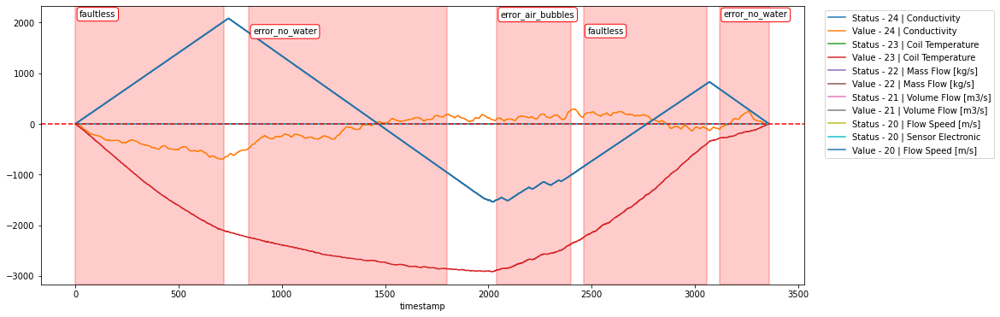

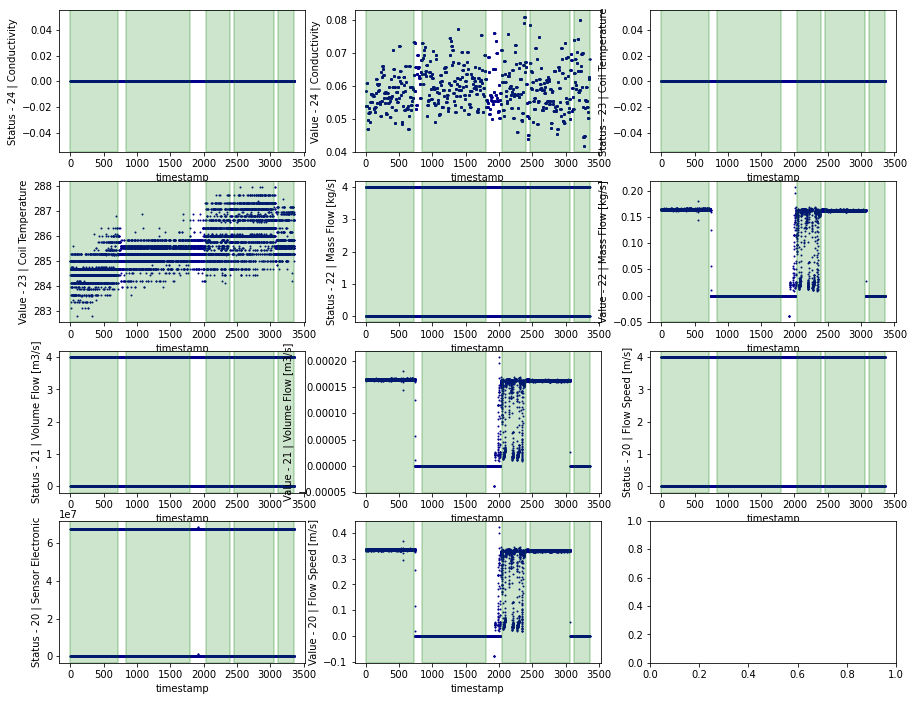

In [75]:
data = pd.read_pickle(f'{transformed_path}/freq_group_2_vals.pkl')
expLookupDF = pd.read_pickle(lookup_path)

ax = viz.plot_data(data.copy(), True, True) 
expLookupDF.apply(lambda row: viz.plot_experiments(ax, row,"red", True, 0), axis=1)    
viz.plot_scatter(data, 3, expLookupDF)